In [715]:
#Cours de Machine Learning
#TP 2
#Antonin Berthon

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from math import *
from tqdm import tqdm

# Partie 2.1

In [728]:
fname="velib-enpc.npz"
with  np.load(fname) as obj:
    # Dictionnaire des informations des stations idvelib->(nom,adresse,x,y,nbre attaches,long,lat)
    stations = dict(obj['stations'].tolist())
    # Correspondance idvelib->ligne matrice
    stations_idx = dict(obj['stations_idx'].tolist())
    # Correspondance ligne matrice->idvelib
    idx_stations = dict(obj['idx_stations'].tolist())
    # Matrice du nombre de velos dispo par station par minute
    histo = obj['histo']

parismap = mpimg.imread("paris.jpg")

# Permet d'affi@@cher la carte de Paris
def show_map():
    plt.imshow(parismap,extent=[0,1,0,1],aspect=0.6)

geo_data = np.array([ [x[2],x[3],x[4]] for x in stations.values()])

plt.figure(figsize=(20,10))
plt.suptitle("Répartition des stations vélib dans Paris et ses environs", fontsize = 20)
show_map()
plt.scatter(geo_data[:,0],geo_data[:,1],alpha=0.2,color="red")
plt.show()

In [726]:
def show_histogram(step):
    #### Constantes Histogramme
    STEPS =  step
    geo_exemple= np.zeros((STEPS,STEPS))


    #Nombre total de vélib
    N = sum(geo_data[:, 2])

    for (x, y, w) in geo_data:
        x_grid, y_grid = min(STEPS-1, floor((x)*(STEPS))), min(STEPS-1, floor((y)*(STEPS)))
        geo_exemple[x_grid, y_grid] += w


    resultat = geo_exemple/(N*STEPS*STEPS)


    plt.figure(figsize=(15,8))

    plt.imshow(resultat.T,extent=[0,1,0,1],interpolation='none',alpha=0.3,origin = "lower",aspect=0.6)
    plt.colorbar()
    plt.scatter(geo_data[:,0],geo_data[:,1],alpha=0.3,color="red")

    plt.show()

In [729]:
show_histogram(10)

Le pas de discrétisation semble un peu élevé quand on compare la grille à la répartition des stations velib.

In [719]:
show_histogram(30)

Cette fois le pas de discrétisation est trop faible, on fait du sur-apprentissage.

In [720]:
show_histogram(20)

Ce pas de discrétisation semble satisfaisant pour la répartition des stations velib.

<p>Le modèle n'est composé que d'un hyperparamètre, à savoir le pas de discrétisation. En prenant un pas constant sur toutes les dimensions comme ici, cet hyperparamètre reste unique quelque soit le nombre de dimension ce qui est un avantage.</p>
<p>Cependant cette méthode a ses limites. En effet une case de la grille peut être à quelques 'pixels' près de d'autres stations vélib, ce qui peut amener certaines cases correspondant à des zones denses en stations à ne pas apparaître aussi dense dans la modélisation.</p>

# Partie 2.2

<h1>Fenêtres de Parzen</h1>
<h2>Implémentation</h2>

In [99]:
def uni(x, data, sigma):
    x = np.abs((x-data)/sigma)
    a = np.full(x.shape, 0.5)
    M = np.minimum(a, np.absolute(x))
    
    if (len(x.shape) == 1):
        x = x.reshape(-1, 1)

    bools = np.where(np.max(x, axis=1)<=0.5, 1, 0)
    
    return bools
     
def gaussian(x, data, sigma):
    x = np.abs((x-data)/sigma)
    if (len(x.shape) == 1):
        x = x.reshape(-1, 1)

    res = np.exp(-0.5*np.power(np.linalg.norm(x, axis = 1), 2))/((2*pi)**(len(x.shape)/2))
    return res

In [100]:
def parzen(x, data, weight, sigma, kernel):
    N = np.sum(weight)
    ker = kernel(x, data, sigma)

    densite = np.dot(weight, ker)/(N*sigma**len(data.shape))

    return densite

In [101]:
def separate(data, split):
    '''Scinde un tableau 2D de données en deux tableaux sur les lignes, selon la proportion split'''
    assert ((split < 1) and (split > 0))
    
    idx = np.arange(len(data))
    idx = np.random.permutation(idx)

    train_data = data[idx[:int(split*len(data))], :]
    test_data = data[idx[int(split*len(data)):], :]
    
    return train_data, test_data

<h2>Tests</h2>

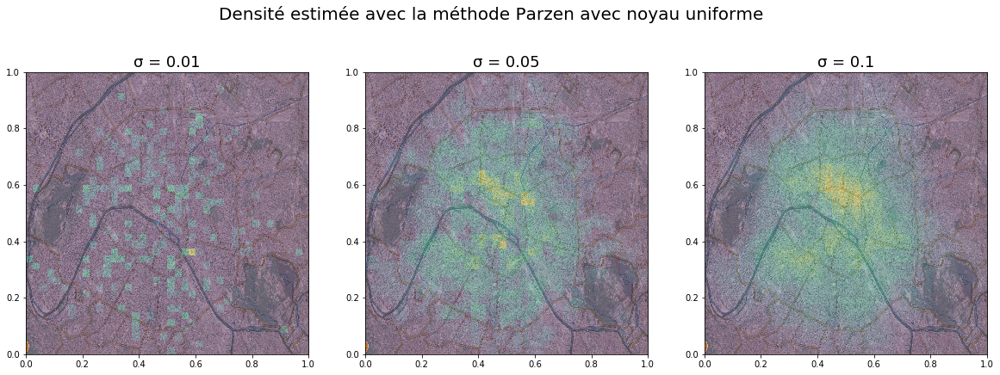

In [665]:
split = 0.7

train_data, test_data = separate(geo_data, split)

#Evaluer une densite 2d sur une discretisation de pas STEPS de [0,1]^2
STEPS = 40
xx,yy = np.meshgrid(np.linspace(0,1,STEPS),np.linspace(0,1,STEPS))
grid = np.c_[xx.ravel(),yy.ravel()]

densite_uni_1 = np.array([parzen(g, geo_data[:,:2], geo_data[:,2], 0.01, uni) for g in grid]).reshape((STEPS,STEPS))
densite_uni_2 = np.array([parzen(g, geo_data[:,:2], geo_data[:,2], 0.05, uni) for g in grid]).reshape((STEPS,STEPS))
densite_uni_3 = np.array([parzen(g, geo_data[:,:2], geo_data[:,2], 0.1, uni) for g in grid]).reshape((STEPS,STEPS))


plt.figure(figsize=(20, 7))
plt.suptitle("Densité estimée avec la méthode Parzen avec noyau uniforme", fontsize=20) 
             
plt.subplot(1, 3, 1)
show_map()
plt.imshow(densite_uni_1, extent=[0,1,0,1], interpolation='none', alpha=0.3, origin="lower")
plt.title("σ = 0.01", fontsize=18)

plt.subplot(1, 3, 2)
show_map()
plt.imshow(densite_uni_2, extent=[0,1,0,1], interpolation='none', alpha=0.3, origin="lower")
plt.title("σ = 0.05", fontsize=18)

plt.subplot(1, 3, 3)
show_map()
plt.imshow(densite_uni_3, extent=[0,1,0,1], interpolation='none', alpha=0.3, origin="lower")
plt.title("σ = 0.1", fontsize=18)

plt.show()

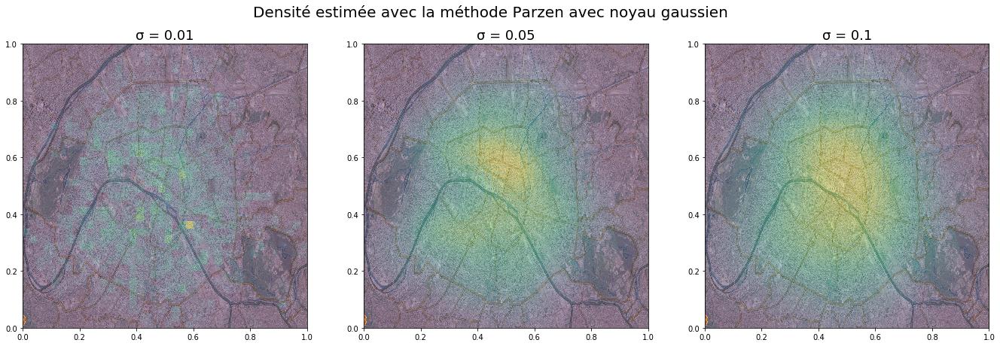

In [666]:
densite_gauss_1 = np.array([parzen(g, geo_data[:,:2], geo_data[:,2], 0.01, gaussian) for g in grid]).reshape((STEPS,STEPS))
densite_gauss_2 = np.array([parzen(g, geo_data[:,:2], geo_data[:,2], 0.05, gaussian) for g in grid]).reshape((STEPS,STEPS))
densite_gauss_3 = np.array([parzen(g, geo_data[:,:2], geo_data[:,2], 0.1, gaussian) for g in grid]).reshape((STEPS,STEPS))


plt.figure(figsize=(23, 7))
plt.suptitle("Densité estimée avec la méthode Parzen avec noyau gaussien", fontsize=20) 
             
plt.subplot(1, 3, 1)
show_map()
plt.imshow(densite_gauss_1, extent=[0,1,0,1], interpolation='none', alpha=0.3, origin="lower")
plt.title("σ = 0.01", fontsize=18)

plt.subplot(1, 3, 2)
show_map()
plt.imshow(densite_gauss_2, extent=[0,1,0,1], interpolation='none', alpha=0.3, origin="lower")
plt.title("σ = 0.05", fontsize=18)

plt.subplot(1, 3, 3)
show_map()
plt.imshow(densite_gauss_3, extent=[0,1,0,1], interpolation='none', alpha=0.3, origin="lower")
plt.title("σ = 0.1", fontsize=18)

plt.show()

## Observations
* Sigma correspond au rayon du voisinnage qui va influencer la densité du point considérer. Ainsi lorsqu'il tend vers 0, aucun point n'influencera les points considérés qui auront donc tous une densité nulle, et inversement si sigma tend vers l'infini, tous les points considérés seront influencés par toutes les données, et auront donc tous la même densité.
* Pour le noyau uniforme, il semble qu'un bon sigma soit de l'ordre de 0.1.
* Pour le noyau gaussien, un bon sigma semble plus faible que pour le noyau uniforme, entre 0.01 et 0.05 à vue d'oeil.

<h2>Evaluation des modèles</h2>
<p>Il est difficile d'appliquer la méthode des moindres carrés pour estimer les performances du modèle puisqu'ici on s'intéresse à la probabilité qu'un station soit ou ne soit pas à un endroit donné. La méthode des moindres carrés s'applique mal sur des variables "booléennes" (une station est ou n'est pas à un endroit donné).</p>
<p>Pour étudier la performance du modèle, on utilise donc une méthode de maximisation de la log-vraissemblance.</p>

In [576]:
def log_vraissemblance(data, sigma, split, kernel):
    """Calcul la vraissemblance d'un ensemble test sur une densité calculée à partir d'un ensemble d'entrainement"""
    train_data, test_data = separate(geo_data, split)
    
    L = 0
    for x in test_data:
        p = parzen(x[:2], train_data[:, :2], train_data[:, 2], sigma, kernel)
        #if (p!=0):    
        L += log(p + 10**(-10))
        #else:
         #   L += log(10**(-30))
    
    return L/len(test_data)


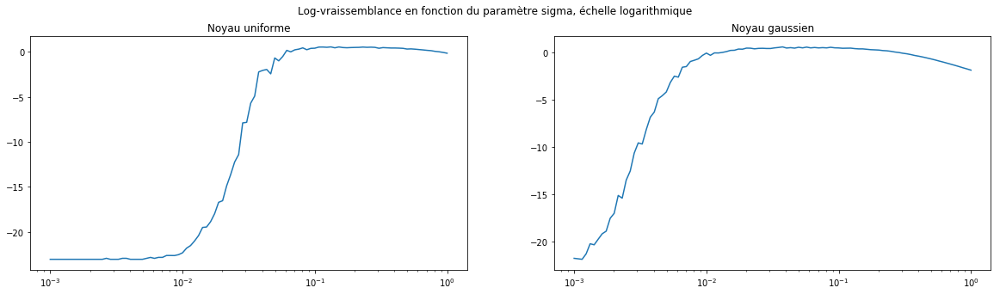

In [673]:
split = 0.8
sigmas = np.logspace(-3, 0, 100)

scores_gaussian = [log_vraissemblance(geo_data, sigma, split, gaussian) for sigma in sigmas]
scores_uni = [log_vraissemblance(geo_data, sigma, split, uni) for sigma in sigmas]


plt.figure(figsize=(20, 5))
plt.suptitle('Log-vraissemblance en fonction du paramètre sigma, échelle logarithmique')
plt.subplot(1, 2, 1)
plt.title('Noyau uniforme')
plt.semilogx(sigmas, scores_uni)

plt.subplot(1, 2, 2)
plt.title('Noyau gaussien')
plt.semilogx(sigmas, scores_gaussian)
plt.show()


In [674]:
print('Sigma uni:', sigmas[np.argmax(scores_uni)])
print('Sigma gaussian:', sigmas[np.argmax(scores_gaussian)])

Sigma uni: 0.132194114847
Sigma gaussian: 0.0376493580679


## Observations
Les paramètres optimaux varient selon le découpage aléatoire des données en données d'entrainement et de test. Après avoir effectué plusieurs fois la simulation ci-dessus, j'ai décidé de garder comme valeurs de $\sigma$ pour les noyaux uniformes et gaussiens:
$\sigma_{uniform}\simeq0.2$ et $\sigma_{gaussian}\simeq0.04$
<p>Par ailleurs, les résultats semble meilleurs avec le noyau gaussien.</p>

# Estimateur de Nadaraya-Watson et K plus proches voisins

<h2>Construction de la matrice <i>take</i></h2>

In [697]:
#take_i,j = nombre de vélo emprunté à la station i à la minute j.
take = np.maximum(histo[:, :-1] - histo[:, 1:], np.zeros((histo[:, 1:].shape)))
take = np.hstack((np.zeros((len(take), 1)), take))

In [ ]:
def emprunt_par_minute(station, jour):
    """Retourne le nombre d'emprunt par minute d'une station pour une journée donnée 
    parmi les 28 jours de la base de données"""
    
    return np.mean(take[station, 1440*jour: 1440*(jour+1)])

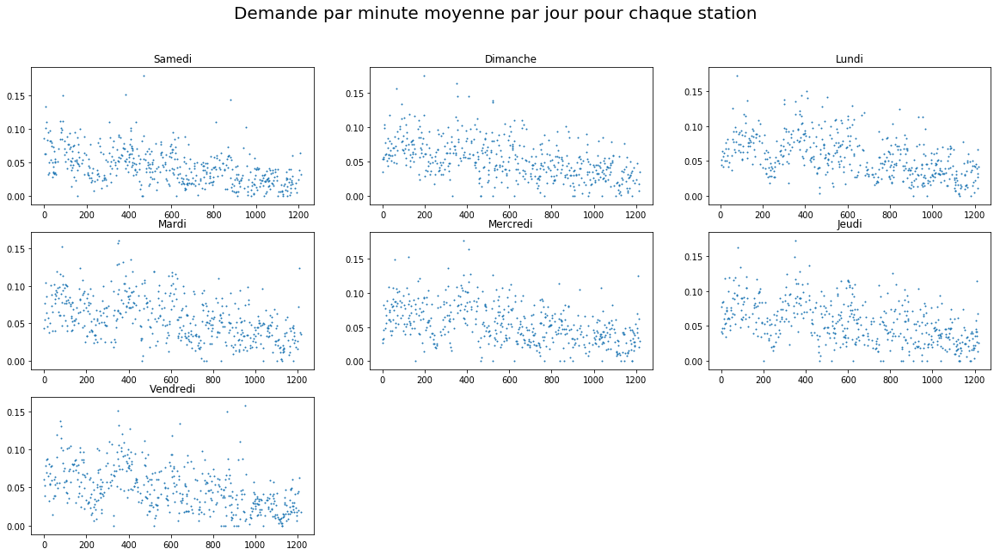

In [586]:
id_stations = [stations_idx[id] for id in stations.keys()]

jours = {'1': 'Samedi', '2': 'Dimanche', '3': 'Lundi', '4': 'Mardi', '5': 'Mercredi', '6': 'Jeudi', '7': 'Vendredi'}

plt.figure(figsize = (20, 10))
plt.suptitle('Demande par minute moyenne par jour pour chaque station', fontsize = 20)

for i in range (1, 8):
    plt.subplot(3, 3, i)
    id_stations_tot = [stations_idx[id] for id in stations.keys()]
    id_stations = np.random.permutation(id_stations_tot)[:500]
    plt.scatter(id_stations, [emprunt_par_minute(station, i) for station in id_stations], s=1)
    plt.title(jours[str(i)])
plt.show()

Il apparait déjà que la demande semble varier beaucoup d'une station à une autre, et d'un jour à l'autre.

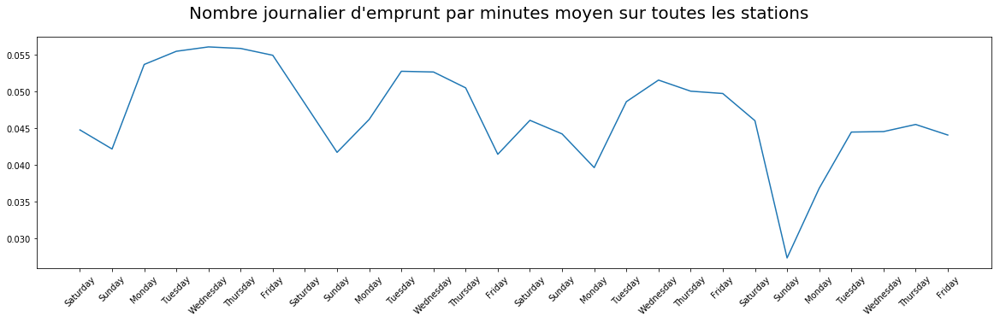

In [113]:
days = ['Saturday', 'Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']

jours = np.linspace(0, 27, 28, dtype = 'int')

plt.figure(figsize=(20, 5))
plt.suptitle("Nombre journalier d'emprunt par minutes moyen sur toutes les stations", fontsize = 20)
plt.xticks(jours, days*4, rotation = 45)
plt.plot(jours, [np.mean([emprunt_par_minute(station, i) for station in id_stations]) for i in jours])

plt.show()

Il apparait une sorte de périodicité de la demande sur chaque semaine, avec une baisse les week-end par rapport à la semaine. Pour modéliser la demande, on peut donc faire l'hypothèse que <b>celle-ci reste la même entre les semaines</b>.

<h2>Implémentation de l'estimateur de Nadaraya_Watson</h2>

In [114]:
def Nadaraya_Watson(x, data, sigma, kernel):
    """Renvoie l'estimateur de densité de Nadaraya-Watson
        à partir des données test data et en utilisant le noyau kernel"""
    
    
    num = np.dot(data[1].T, kernel(x, data[0], sigma))
    den = np.dot(np.ones(len(data[0])), kernel(x, data[0], sigma))
    
    return num/den

In [115]:
def NW_fhat(idstation, journee_depart, nombre_journees, step, kernel, sigma):
    
    debut = journee_depart*1440
    fin = (journee_depart+nombre_journees)*1440
    
    if (type(idstation)!=int):
        data = [[t for t in range (fin-debut)], np.mean(take[idstation[0]:idstation[1], debut:fin], axis = 0)]
    else:
        data = [[t for t in range (fin-debut)], take[idstation, debut:fin]]

    minutes = np.arange(0, fin-debut, step)

    densite = [Nadaraya_Watson(m, data, sigma, kernel) for m in minutes]
    
    return densite

<h2>Tests</h2>

<h3>Test sur une station, pour plusieurs $\sigma$</h3>

In [587]:
dens_10 = NW_fhat(0, 0, 7, step, gaussian, 10)
dens_30 = NW_fhat(0, 0, 7, step, gaussian, 30)
dens_60 = NW_fhat(0, 0, 7, step, gaussian, 60)
dens_100 = NW_fhat(0, 0, 7, step, gaussian, 100)
dens_500 = NW_fhat(0, 0, 7, step, gaussian, 500)


In [588]:
dens_10_u = NW_fhat(0, 0, 7, step, uni, 10)
dens_30_u = NW_fhat(0, 0, 7, step, uni, 30)
dens_60_u = NW_fhat(0, 0, 7, step, uni, 60)
dens_100_u = NW_fhat(0, 0, 7, step, uni, 100)
dens_500_u = NW_fhat(0, 0, 7, step, uni, 500)

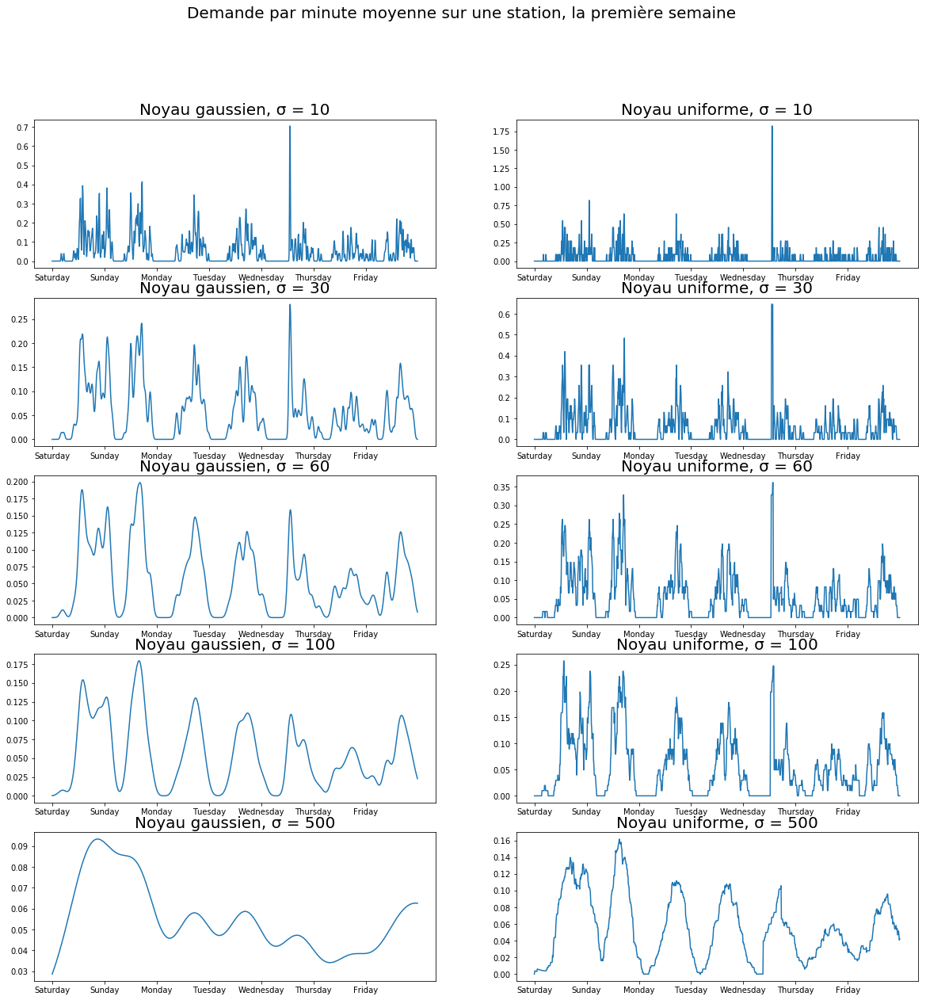

In [678]:
journee_depart, nombre_journees = 0, 7
debut = journee_depart*1440
fin = (journee_depart + nombre_journees)*1440
step = 10
sigma = 30
minutes = np.arange(0, fin-debut, step)

plt.figure(figsize=(20, 20))
plt.suptitle('Demande par minute moyenne sur une station, la première semaine', fontsize = 20)

plt.subplot(5, 2, 1)
plt.plot(minutes, dens_10)
plt.xticks(np.arange(0, nombre_journees*1440, 1440), (days*4)[0:7+nombre_journees])
plt.title('Noyau gaussien, σ = 10', fontsize= 20)

plt.subplot(5, 2, 2)
plt.plot(minutes, dens_10_u)
plt.xticks(np.arange(0, nombre_journees*1440, 1440), (days*4)[0:7+nombre_journees])
plt.title('Noyau uniforme, σ = 10', fontsize= 20)

plt.subplot(5, 2, 3)
plt.plot(minutes, dens_30)
plt.xticks(np.arange(0, nombre_journees*1440, 1440), (days*4)[0:7+nombre_journees])
plt.title('Noyau gaussien, σ = 30', fontsize= 20)

plt.subplot(5, 2, 4)
plt.plot(minutes, dens_30_u)
plt.xticks(np.arange(0, nombre_journees*1440, 1440), (days*4)[0:7+nombre_journees])
plt.title('Noyau uniforme, σ = 30', fontsize= 20)

plt.subplot(5, 2, 5)
plt.plot(minutes, dens_60)
plt.xticks(np.arange(0, nombre_journees*1440, 1440), (days*4)[0:7+nombre_journees])
plt.title('Noyau gaussien, σ = 60', fontsize= 20)

plt.subplot(5, 2, 6)
plt.plot(minutes, dens_60_u)
plt.xticks(np.arange(0, nombre_journees*1440, 1440), (days*4)[0:7+nombre_journees])
plt.title('Noyau uniforme, σ = 60', fontsize= 20)

plt.subplot(5, 2, 7)
plt.plot(minutes, dens_100)
plt.xticks(np.arange(0, nombre_journees*1440, 1440), (days*4)[0:7+nombre_journees])
plt.title('Noyau gaussien, σ = 100', fontsize= 20)

plt.subplot(5, 2, 8)
plt.plot(minutes, dens_100_u)
plt.xticks(np.arange(0, nombre_journees*1440, 1440), (days*4)[0:7+nombre_journees])
plt.title('Noyau uniforme, σ = 100', fontsize= 20)

plt.subplot(5, 2, 9)
plt.plot(minutes, dens_500)
plt.xticks(np.arange(0, nombre_journees*1440, 1440), (days*4)[0:7+nombre_journees])
plt.title('Noyau gaussien, σ = 500', fontsize= 20)

plt.subplot(5, 2, 10)
plt.plot(minutes, dens_500_u)
plt.xticks(np.arange(0, nombre_journees*1440, 1440), (days*4)[0:7+nombre_journees])
plt.title('Noyau uniforme, σ = 500', fontsize= 20)


plt.show()


Le paramètre $\sigma$ représente le nombre de minutes autour d'un instant t qui vont avoir une influence sur la demande estimée en cet instant.
Ainsi une valeur de $\sigma$ trop faible conduit à faire du sur-apprentissage, tandis qu'une valeur trop forte aura pour effet de lisser la courbe de demande et on ne verra plus précisément les tendances à l'échelle d'une journée.
<p>De plus, il semble que le noyau uniforme ait besoin d'un $\sigma$ plus élevé que le noyau gaussien.</p>

<h3>Test sur toutes les stations, pour toutes les semaines</h3>

In [120]:
dens_s0 = NW_fhat((0, 1216), 0, 7, step, gaussian, sigma)
dens_s1 = NW_fhat((0, 1216), 7, 7, step, gaussian, sigma)
dens_s2 = NW_fhat((0, 1216), 14, 7, step, gaussian, sigma)
dens_s3 = NW_fhat((0, 1216), 21, 7, step, gaussian, sigma)

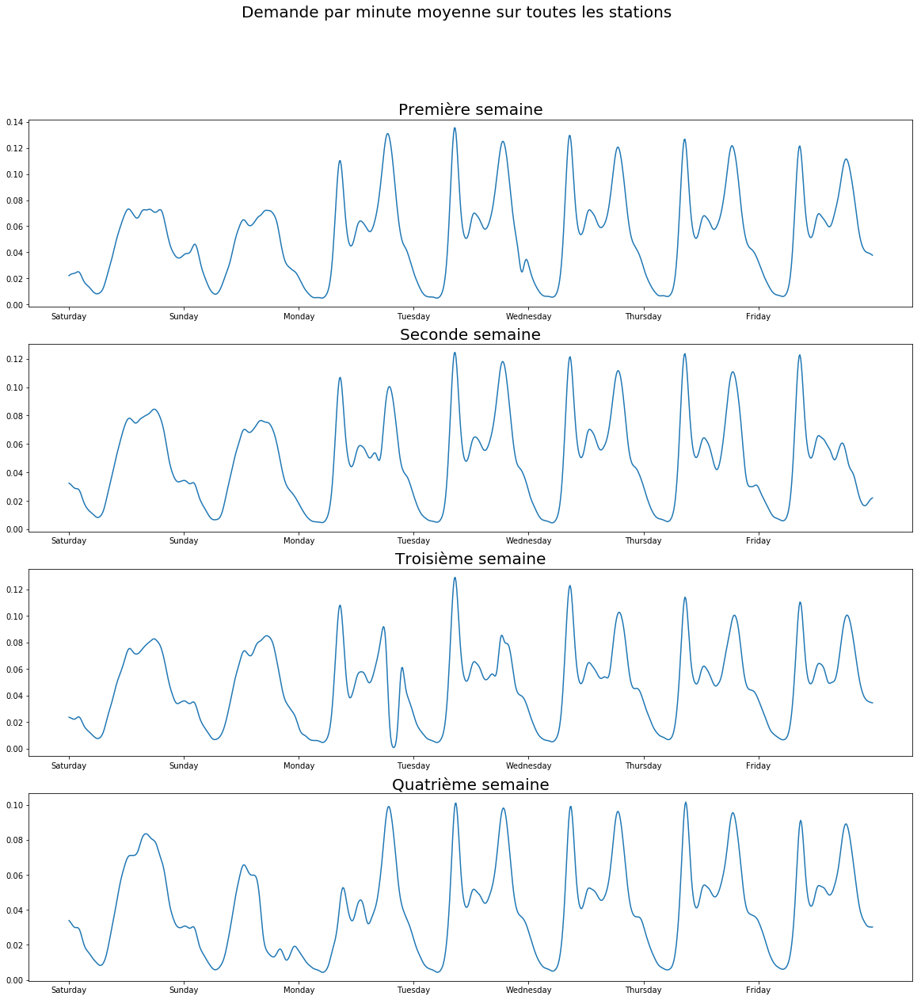

In [680]:
minutes = np.arange(0, fin-debut, step)

plt.figure(figsize=(20, 20))
plt.suptitle('Demande par minute moyenne sur toutes les stations', fontsize= 20)

plt.subplot(4, 1, 1)
plt.plot(minutes, dens_s0)
plt.xticks(np.arange(0, nombre_journees*1440, 1440), (days*4)[0:7+nombre_journees])
plt.title('Première semaine', fontsize= 20)

plt.subplot(4, 1, 2)
plt.plot(minutes, dens_s1)
plt.xticks(np.arange(0, nombre_journees*1440, 1440), (days*4)[0:7+nombre_journees])
plt.title('Seconde semaine', fontsize= 20)

plt.subplot(4, 1, 3)
plt.plot(minutes, dens_s2)
plt.xticks(np.arange(0, nombre_journees*1440, 1440), (days*4)[0:7+nombre_journees])
plt.title('Troisième semaine', fontsize= 20)

plt.subplot(4, 1, 4)
plt.plot(minutes, dens_s3)
plt.xticks(np.arange(0, nombre_journees*1440, 1440), (days*4)[0:7+nombre_journees])
plt.title('Quatrième semaine', fontsize= 20)


plt.show()


En moyennant sur toutes les station on fait apparaitre des tendances qui se retrouvent les quatre semaines.
* La demande semble être gaussienne sur les journées du week-end.
* On observe une légère demande supplémentaire les vendredis et samedis soirs, que l'on peut supposer provenir des stations proches des quartiers animés de Paris.
* Les jours de la semaine, on observe deux pics correspondants aux départs et sorties de travail.

<h2>Etude de la performance du modèle</h2>

Pour étudier la performance des modèles il faut, au sein d'une même station, séparer les données temporelles aléatoirement.
<p>On applique ensuite la méthode de minimisation des moindres carrés.</p>

In [594]:
def separate_1D(data, split):
    '''Scinde un tableau 1D de données en deux tableaux, selon la proportion split'''
    assert ((split < 1) and (split > 0))

    idx = np.arange(len(data))
    idx = np.random.permutation(idx)

    train_data = data[idx[:int(split*len(data))]]
    test_data = data[idx[int(split*len(data)):]]
    
    minutes = np.arange(len(data))
    train_minutes = idx[:int(split*len(data))]
    test_minutes = idx[int(split*len(data)):]


    return train_data, test_data, train_minutes, test_minutes

In [595]:
def take_sum(idstations, debut, fin):
    return np.sum(take[idstations, debut:fin], axis = 1)

def mse_NW(data, train_data, test_data, debut, fin, sigma, split, kernel):
    """Calcul la vraissemblance d'un ensemble test sur une densité calculée à partir d'un ensemble d'entrainement"""

    S = 0
    for i in range (len(test_data[1])):
        yhat = Nadaraya_Watson(test_data[0][i], train_data, sigma, kernel)
        S += (test_data[1][i]-yhat)**2
    
    return S/len(test_data)


In [683]:
sigmas = np.linspace(10, 200, 100)
split = 0.8


def get_densite(idstation, journee_depart):  
    """Retourne une densité pour chaque sigma parcouru, en moyennant la demande 
    sur les quatre jours du mois correspondant à journee_depart,
    grâce à l'hypothèse de périodicité faite ci-dessus."""
    debut = journee_depart*1440
    fin = (journee_depart+1)*1440
    if (type(idstation) != int):
        demande_4j = np.mean([take[i, debut:fin]
                      + take[i, debut+ 7*1440 :fin + 7*1440]
                      + take[i, debut+ 14*1440 :fin + 14*1440]
                      + take[i, debut+ 21*1440 :fin + 21*1440] for i in idstation], axis = 0)
    else:
        demande_4j = (take[idstation, debut:fin]
                      + take[idstation, debut+ 7*1440 :fin + 7*1440]
                      + take[idstation, debut+ 14*1440 :fin + 14*1440]
                      + take[idstation, debut+ 21*1440 :fin + 21*1440])
                  
    train_data, test_data, train_minute, test_minute = separate_1D(demande_4j, split)
    train_data = [train_minute, train_data]
    test_data = [test_minute, test_data]

    dens_gauss=[mse_NW(take, train_data, test_data, debut, fin, s, split, gaussian) for s in sigmas]
    dens_uni=[mse_NW(take, train_data, test_data, debut, fin, s, split, uni) for s in sigmas]


    return dens_gauss, dens_uni



Pour s'affranchir de la partie aléatoire dûe à la séparation en deux ensembles d'entrainement et de test, on s'intéresse à l'erreur des moindres carrés sur plusieurs stations et plusieurs jours différents.

In [685]:
dens_gauss_10, dens_uni_10 = get_densite(10, 2)
dens_gauss_100, dens_uni_100 = get_densite(100, 4)
dens_gauss_1000, dens_uni_1000 = get_densite(1000, 6)
dens_gauss_multi, dens_uni_multi = get_densite([i for i in range (1217)], 0)

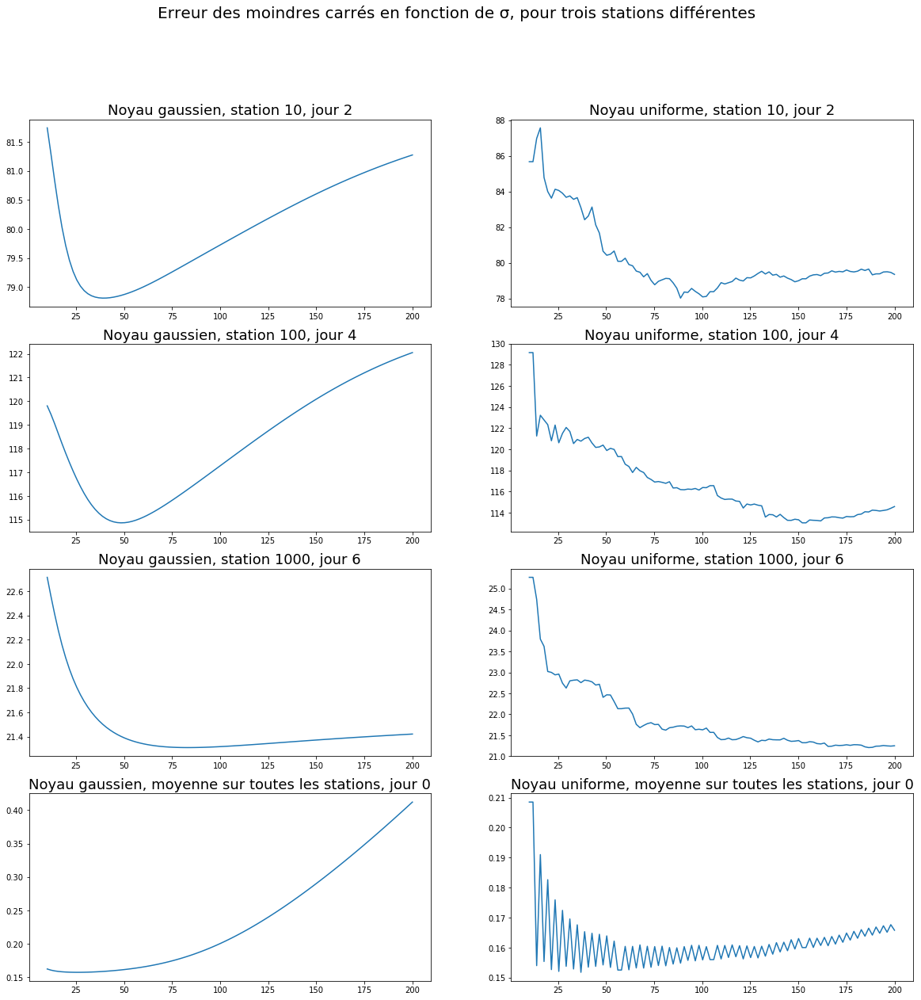

In [686]:
plt.figure(figsize=(20, 20))
plt.suptitle('Erreur des moindres carrés en fonction de σ, pour trois stations différentes', fontsize = 20)

plt.subplot(4, 2, 1)
plt.plot(sigmas, dens_gauss_10)
plt.title('Noyau gaussien, station 10, jour 2', fontsize= 18)

plt.subplot(4, 2, 2)
plt.plot(sigmas, dens_uni_10)
plt.title('Noyau uniforme, station 10, jour 2', fontsize= 18)

plt.subplot(4, 2, 3)
plt.plot(sigmas, dens_gauss_100)
plt.title('Noyau gaussien, station 100, jour 4', fontsize= 18)

plt.subplot(4, 2, 4)
plt.plot(sigmas, dens_uni_100)
plt.title('Noyau uniforme, station 100, jour 4', fontsize= 18)

plt.subplot(4, 2, 5)
plt.plot(sigmas, dens_gauss_1000)
plt.title('Noyau gaussien, station 1000, jour 6', fontsize= 18)

plt.subplot(4, 2, 6)
plt.plot(sigmas, dens_uni_1000)
plt.title('Noyau uniforme, station 1000, jour 6', fontsize= 18)

plt.subplot(4, 2, 7)
plt.plot(sigmas, dens_gauss_multi)
plt.title('Noyau gaussien, moyenne sur toutes les stations, jour 0', fontsize= 18)

plt.subplot(4, 2, 8)
plt.plot(sigmas, dens_uni_multi)
plt.title('Noyau uniforme, moyenne sur toutes les stations, jour 0', fontsize= 18)

plt.show()

## Observations
Au vue des simulations ci-dessus, on choisi comme paramètres:
$\sigma_{uniform}\simeq100$ et $\sigma_{gaussian}\simeq50$


# Question 2.11
<p>On pourrait utiliser le même algorithme pour représenter la demande pour un point $(x, y)$ à un instant donné $t$. Chaque couple $(X^i, Y^i)$ serait alors de la forme $( (x, y, t)^i,  demande^i)$.</p>
<p>Dans la suite on fait le choix de n'évoluer qu'avec le noyau gaussien, mais tout pourrait être fait de façon analogue avec le noyau uniforme.</p>

<h2>Implémentation</h2>

In [128]:
def Nadaraya_Watson_u(X, data, labels, sigma_x, sigma_t, kernel):
    """Renvoie l'estimateur de densité de Nadaraya-Watson
        à partir des données test data et en utilisant le noyau kernel"""
    
    x, y, t = X
    
    noyau1 = kernel(X[0], data[:, 0], sigma_t)
    noyau2 = kernel(X[1:], data[:, 1:], sigma_x)
    num = np.dot(labels.T, noyau1*noyau2)
    den = np.dot(np.ones(len(data)), noyau1*noyau2)
    
    return num/den


In [690]:
def NW_hat_multi(minute):
    """Retourne les densités de toute la carte discrétisée pour le temps indiqué par 'minute'."""
    
    #Avec un sigma d'environ 50 on peut rogner les données temporelles à 100 minutes de part et d'autre du temps considéré
    data = np.array([[minute + t - 100, stations[idx_stations[i]][2], stations[idx_stations[i]][3]] 
             for t in range (200) for i in range (1217)])
    labels = np.array([take[i, minute + t - 100] for t in range (200) for i in range (1217)])



    #Evaluer une densite 2d sur une discretisation de pas STEPS de [0,1]^2
    STEPS = 30
    xx,yy = np.meshgrid(np.linspace(0,1,STEPS),np.linspace(0,1,STEPS))
    grid = np.c_[xx.ravel(),yy.ravel()]

    densite = np.array([Nadaraya_Watson_u(np.array([minute, g[0], g[1]]), data, labels, sigma_x, sigma_t, gaussian) 
                        for g in grid]).reshape((STEPS,STEPS))

    
    densite[np.isnan(densite)] = 0

    return densite


def to_minute(jour, heure):
    """Traduit un nombre de journées et d'heures en minutes"""
    return 1440*jour + 60*heure

<h2>Tests</h2>

In [692]:
sigma_t = 50
sigma_x = 0.04

densite_4_8 = NW_hat_multi(to_minute(4, 8))
densite_4_18 = NW_hat_multi(to_minute(4, 18))
densite_4_23 = NW_hat_multi(to_minute(4, 23))

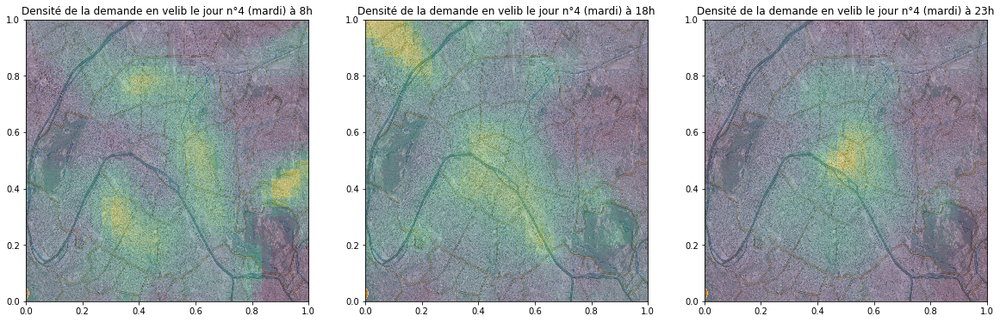

In [693]:
plt.figure(figsize=(20, 7))

plt.subplot(1, 3, 1)
show_map()
plt.imshow(densite_4_8, extent=[0,1,0,1], interpolation='none', alpha=0.3, origin="lower")
plt.title("Densité de la demande en velib le jour n°4 (mardi) à 8h")

plt.subplot(1, 3, 2)
show_map()
plt.imshow(densite_4_18, extent=[0,1,0,1], interpolation='none', alpha=0.3, origin="lower")
plt.title("Densité de la demande en velib le jour n°4 (mardi) à 18h")

plt.subplot(1, 3, 3)
show_map()
plt.imshow(densite_4_23, extent=[0,1,0,1], interpolation='none', alpha=0.3, origin="lower")
plt.title("Densité de la demande en velib le jour n°4 (mardi) à 23h")

plt.show()

Le problème de cet algorithme est qu'on va trouver de la demande dans des régions désertiques en station, puisque l'absence de stations ne compense pas la demande temporelle qui sera non nulle la plupart du temps, même dans de telles zones.

In [132]:
densite_7_8 = NW_hat_multi(to_minute(7, 8))
densite_7_18 = NW_hat_multi(to_minute(7, 18))
densite_7_23 = NW_hat_multi(to_minute(7, 23))

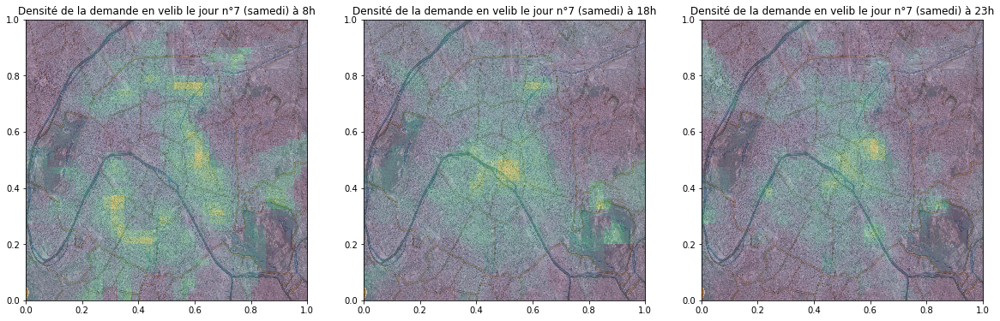

In [133]:
plt.figure(figsize=(20, 7))

plt.subplot(1, 3, 1)
show_map()
plt.imshow(densite_7_8, extent=[0,1,0,1], interpolation='none', alpha=0.3, origin="lower")
plt.title("Densité de la demande en velib le jour n°7 (samedi) à 8h")

plt.subplot(1, 3, 2)
show_map()
plt.imshow(densite_7_18, extent=[0,1,0,1], interpolation='none', alpha=0.3, origin="lower")
plt.title("Densité de la demande en velib le jour n°7 (samedi) à 18h")

plt.subplot(1, 3, 3)
show_map()
plt.imshow(densite_7_23, extent=[0,1,0,1], interpolation='none', alpha=0.3, origin="lower")
plt.title("Densité de la demande en velib le jour n°7 (samedi) à 23h")


plt.show()

<h2>Méthode des k plus proches voisins</h2>

In [698]:
def distance(x, data):
    return np.power((x-data), 2)

def get_k_nearest(x, k):
    """Retourne les k lignes de geo_data correspondant aux k stations les plus proches du point x"""
    data = geo_data[:, :-1]
    distance = np.power(x-geo_data[:, :-1], 2)

    k_nearest = np.argpartition(np.linalg.norm(distance, axis = 1), k)[:k]
    
    return k_nearest    

In [699]:
def K_neighbours(x, k, minute):
    data_k = np.mean(take[get_k_nearest(x, k), minute-100:minute+100], axis = 1)
    
    return np.mean(data_k)

def K_hat(k, minute):
    #Evaluer une densite 2d sur une discretisation de pas STEPS de [0,1]^2
    STEPS = 40
    xx,yy = np.meshgrid(np.linspace(0,1,STEPS),np.linspace(0,1,STEPS))
    grid = np.c_[xx.ravel(),yy.ravel()]

    densite = np.array([[K_neighbours(np.array([g[0], g[1]]), k, minute)] for g in grid]).reshape((STEPS,STEPS))

    return densite

    

In [700]:
densiteK_5_8 = K_hat(20, to_minute(5, 8))
densiteK_5_18 = K_hat(20, to_minute(5, 18))
densiteK_5_23 = K_hat(20, to_minute(5, 23))
densiteK_7_8 = K_hat(20, to_minute(7, 8))
densiteK_7_18 = K_hat(20, to_minute(7, 18))
densiteK_7_23 = K_hat(20, to_minute(7, 23))

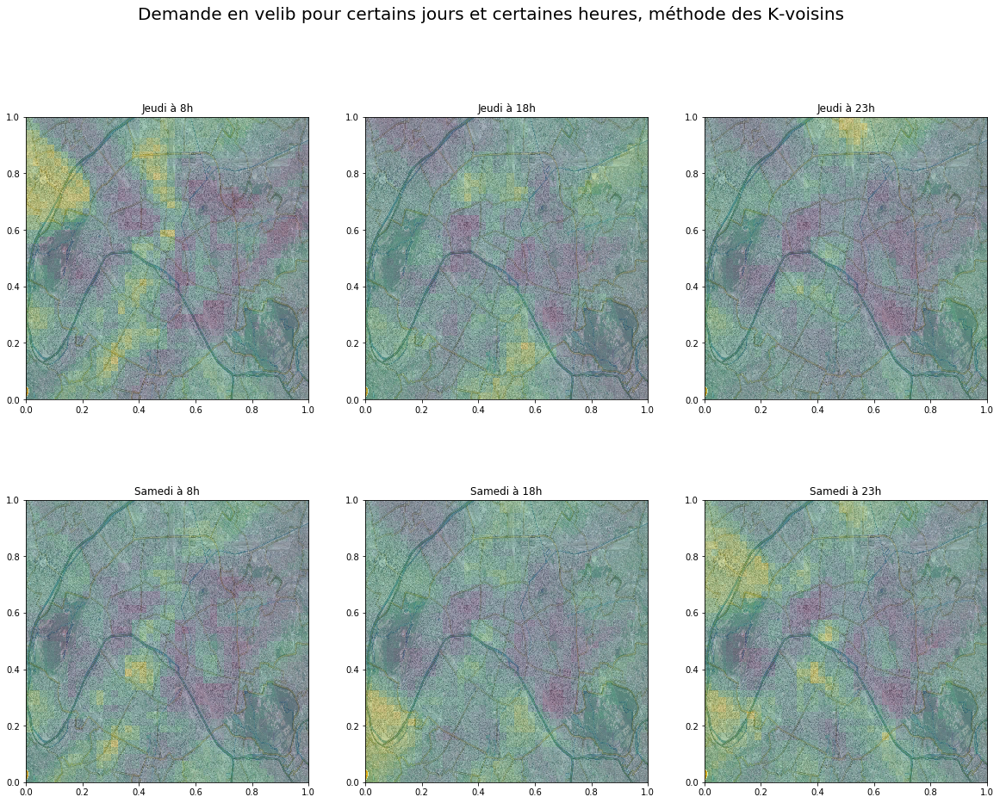

In [701]:
plt.figure(figsize=(20, 15))
plt.suptitle("Demande en velib pour certains jours et certaines heures, méthode des K-voisins", fontsize = 20)
plt.subplot(2, 3, 1)
show_map()
plt.imshow(densiteK_5_8, extent=[0,1,0,1], interpolation='none', alpha=0.3, origin="lower")
plt.title("Jeudi à 8h")

plt.subplot(2, 3, 2)
show_map()
plt.imshow(densiteK_5_18, extent=[0,1,0,1], interpolation='none', alpha=0.3, origin="lower")
plt.title("Jeudi à 18h")

plt.subplot(2, 3, 3)
show_map()
plt.imshow(densiteK_5_23, extent=[0,1,0,1], interpolation='none', alpha=0.3, origin="lower")
plt.title("Jeudi à 23h")

plt.subplot(2, 3, 4)
show_map()
plt.imshow(densiteK_7_8, extent=[0,1,0,1], interpolation='none', alpha=0.3, origin="lower")
plt.title("Samedi à 8h")

plt.subplot(2, 3, 5)
show_map()
plt.imshow(densiteK_7_18, extent=[0,1,0,1], interpolation='none', alpha=0.3, origin="lower")
plt.title("Samedi à 18h")

plt.subplot(2, 3, 6)
show_map()
plt.imshow(densiteK_7_23, extent=[0,1,0,1], interpolation='none', alpha=0.3, origin="lower")
plt.title("Samedi à 23h")

plt.show()

On trouve des résultats un peu aberrants car les zones "extrêmes", désertes en stations ont toujours une demande non nulle car on ne pénalise pas leur distance à leurs plus proches voisins. On trouve parfois même des demandes plus fortes que dans les zones denses en stations, si les stations les plus proches de ces régions désertiques ont une forte demande.
<p>Ces densités font cependant parfois sens, comme le jeudi matin où la forte demande semble correspondre aux bureaux de La Défense.</p>

Pour étudier la performance des modèle on pourrait une nouvelle fois regarder la somme des carrés pour chaque donnée test:

In [138]:
def mse_K(data, train_data, test_data, debut, fin, sigma, split, kernel):
    """Calcul la vraissemblance d'un ensemble test sur une densité calculée à partir d'un ensemble d'entrainement"""

    S = 0
    for i in range (len(test_data[1])):
        yhat = Nadaraya_Watson(test_data[0][i], train_data, sigma, kernel)
        S += (test_data[1][i]-yhat)**2
    
    return S/len(test_data)

# Question 3
<p>Pour opérer un clustering des stations en considérant comme description d'une station la demande par unité de temps, on commence par choisir aléatoirement k stations (avec k le nombre de clusters souhaité). On assigne ensuite chaque station au cluster dont le barycentre se trouve à distance minimale (on prend comme distance la différence au carré des demandes par unités de temps). On itère ensuite les deux étapes suivantes jusqu'à ce qu'on ait atteint un équilibre stable:
<ul>1. On actualise les barycentres de chaque cluster.</ul>
<ul>2. On répartie toute les stations entre les clusters, toujours en minimisant les distances aux barycentres.</ul>
<p> Pour mesurer la performance d'un clustering on peut s'intéresser aux distances intra-cluster de chaque cluster. Comme cette performance peut dépendre des clusters initiaux choisis aléatoirement, on implémente par la suite la possibilité d'effectuer l'algorithme un certain nombre de fois, puis ne conserver que le clustering qui minimise la somme intra-cluster cumulée sur tous les clusters.</p>

<h2>Implémentation</h2>

In [702]:
def choose_random(k):
    """Retourne aléatoirement k stations parmis les 1217 de la base."""
    idx = np.arange(1217)
    idx = np.random.permutation(idx)
    return idx[:k]

def distance(d, mu):
    """Retourne la distance de la demande d au barycentre mu"""
    return (d - mu)**2

def assign_to_clusters(stations, barycentres):
    """Stations: 2 x 1217
    Stations[0]: demande moyenne pour toutes les stations
    Stations[1]: indice de la station dans take"""
    
    clusters = [[] for i in barycentres]
    ranks = [[] for i in barycentres]
    
    for j in range (len(stations[0])):
        i = np.argmin(np.array([distance(stations[0][j], b) for b in barycentres]))
        clusters[i].append(stations[0][j])
        ranks[i].append(stations[1][j])
        
    return np.array(clusters), np.array(ranks)

    
def refresh_barycentres(clusters):
    """Calcul les nouveaux barycentres pour chaque cluster"""
    barycentres = [[] for i in clusters]

    for i in range (len(clusters)):
        barycentres[i] = np.mean(clusters[i])
    
    return np.array(barycentres)    

In [703]:
def k_means(k, minute = -1):
    """Effectue l'algorithme K-moyenne pour k clusters.
    Si minute n'est pas précisé, l'algorithme s'effectue en moyennant la demande sur tout mois
    Si minute est précisé, l'algorithme ne considère la moyenne de la demande qu'autour de ce temps."""
    
    if (minute != -1):
        mean_take = np.vstack((np.mean(take[:, minute - 300 : minute + 300], axis = 1), np.arange(len(take))))
    else:
        mean_take = np.vstack((np.mean(take, axis = 1), np.arange(len(take))))

    init_clusters = mean_take[0][choose_random(k)]

    a = assign_to_clusters(mean_take, init_clusters)[0]

    r = refresh_barycentres(a)

    while True:
        r2 = refresh_barycentres((assign_to_clusters(mean_take, r))[0])
        if (np.equal(r, r2).all()) or isnan(np.mean(r-r2)) :
            break
        else:
            r = r2

    return r

In [721]:
def show_k_means(k, minute = -1, multi_iter = False, test_iter = 15):
    """Affiche la carte des stations réparties selon k clusters .
    Si multi_iter prend la valeur True, on effectue l'algorithme 'test_iter fois' 
    et on ne garde que l'itération avec la plus petite somme intra-cluster cumulée.
    
    Si minute n'est pas précisé, l'algorithme s'effectue en moyennant la demande sur tout mois
    Si minute est précisé, l'algorithme ne considère la moyenne de la demande qu'autour de ce temps."""
    
    #Determination des clusters
    if multi_iter:
        barycentres = [k_means(k, minute) for i in range(test_iter)]
        score = []
        for b in barycentres:
            clusters, ranks = assign_to_clusters(mean_take, b)
            score.append(distance_intra_culster(clusters))
        i_star = np.argmin(np.sum(score, axis = 1))
        clusters, ranks = assign_to_clusters(mean_take, barycentres[i_star])
        
    else:
        barycentre = k_means(k, minute)
        clusters, ranks = assign_to_clusters(mean_take, barycentre)
        
      
    #Affichage
    plt.figure(figsize=(20,10))
    if (minute == -1):
        plt.suptitle("Répartition des stations en {} clusters en fonction de la demande moyenne par unité de temps".format(k), fontsize = 20)
    else:
        plt.suptitle("Répartition des stations en {} clusters en fonction de la demande moyenne par unité de temps \n Le jour n°{} à {}h".format(k, minute//1440, (minute%1440)//60), fontsize = 20)

    show_map()

    for i in range(len(clusters)):
        plt.scatter(geo_data[list(map(int, ranks[i])),0],geo_data[list(map(int, ranks[i])),1],alpha=0.5, 
                    label=str(i+1))
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=1., title=
                   'Classe de demande des stations \nDemande décroissante')
    plt.show()
    return

In [722]:
def distance_intra_culster(clusters):
    dist = [[0] for i in range (len(clusters))]
    
    barycentres = [np.mean(np.array(clusters[i])) for i in range (len(clusters))]
    for i in range(len(clusters)):
        for c in clusters[i]:
            dist[i] += distance(c, barycentres[i])/len(clusters[i])
    
    return np.array(dist)

<h2>Tests</h2>

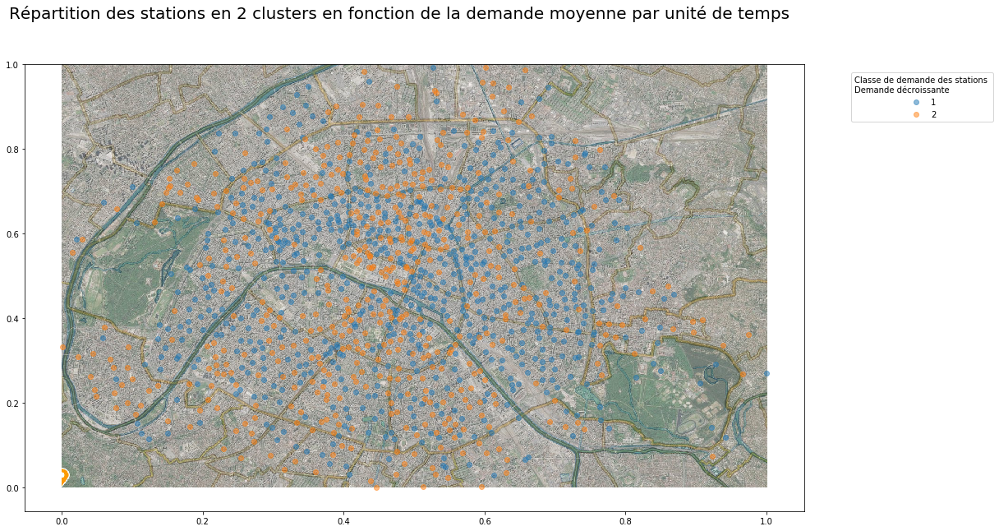

In [723]:
show_k_means(2, multi_iter=True, test_iter = 20)

<p>En répartissant les stations selon des clusters, on peut faire apparaître les zones où la demande est plus ou moins forte. En répartissant les stations entre deux clusters et pour une demande moyennée sur tout le mois, on observe par exemple que certains quartiers utilisent moins les velibs que d'autres, comme par exemple le 8ème arrondissement, le 16ème arrondissement, Belleville (pas étonnant vu le relief !), le  12ème arrondissement.
</p>
<p> Ces observations peuvent utiles pour la mairie si elle souhaite réorganiser au mieux la répartition des stations vélibs dans Paris.
</p>

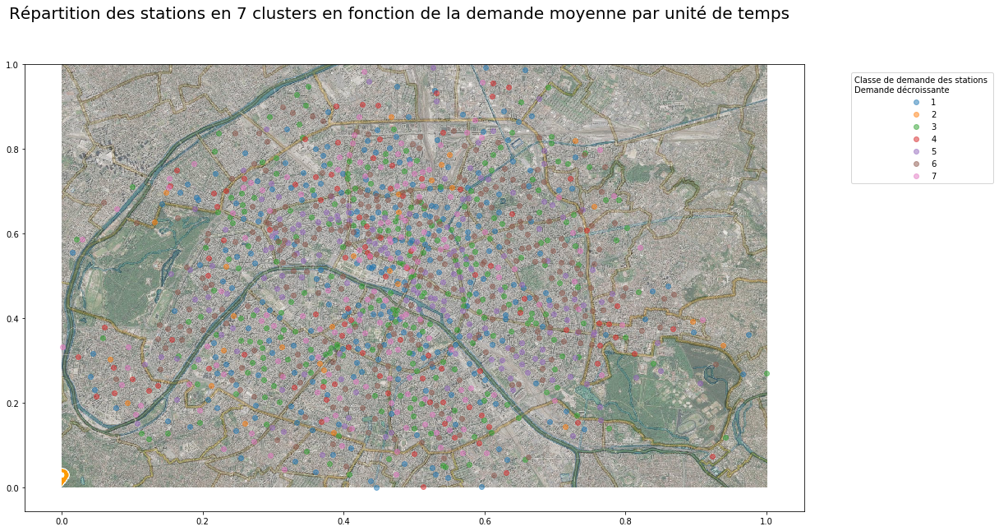

In [724]:
show_k_means(7)

<p>Avec un nombre de clusters plus élevé, il est plus difficile de voir graphiquement les quartiers où la demande est plus forte ou plus faible qu'ailleurs.</p>
<p>Plus de clusters permettent cependant une vision plus fine des différences de demandes entre les quartiers.</p>

<p>En ne considérant comme description des stations qu'une plage de temps autour d'un jour et d'une heure donnée, on peut faire apparaitre les différences de demande dans les stations de la ville autour d'un temps donnée. </p>

/Users/Antonin/miniconda3/lib/python3.5/site-packages/numpy/core/fromnumeric.py:2889: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/Antonin/miniconda3/lib/python3.5/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


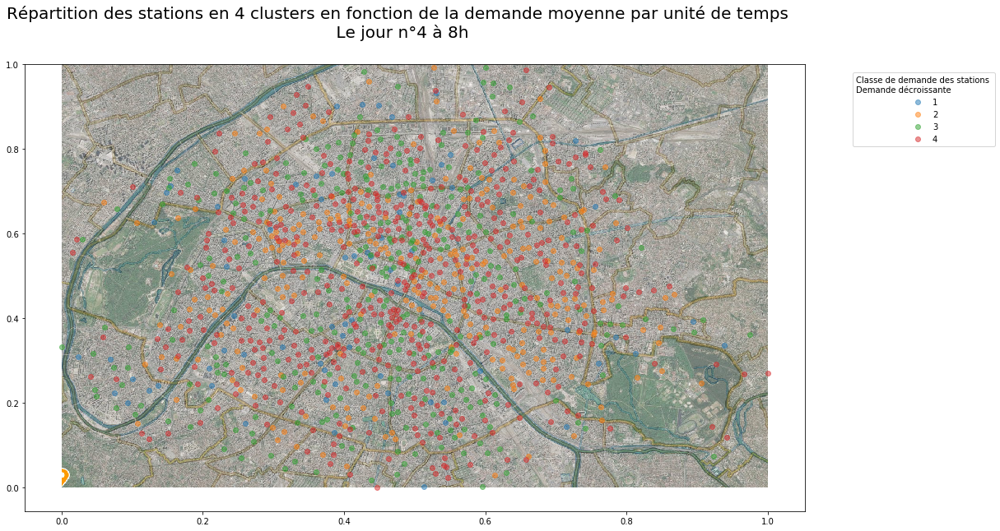

In [725]:
show_k_means(4, to_minute(jour=4, heure=8), multi_iter = True, test_iter = 30)

<p>Ainsi, dans le graphe ci-dessus il apparait qu'un mercredi matin autour de 8h, la demande est plus forte autour des quartiers d'affaire, comme les Champs-Elysées ou Bercy.</p>